Tilte: Seattle AirBnB_1

Author: Kazutoki Matsui

## Inspiration

### 1. Can you describe the vibe of each Seattle neighborhood using listing descriptions?
### 2. What are the busiest times of the year to visit Seattle? By how much do prices spike?
### 3. Is there a general upward trend of both new Airbnb listings and total Airbnb visitors to Seattle?

In [1]:
## Import necessary packages
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
from datetime import datetime
import folium
import folium.plugins
import branca
import branca.colormap as cm
from sklearn.pipeline import Pipeline
from sklearn.model_selection import train_test_split
from sklearn.compose import ColumnTransformer
from sklearn.preprocessing import OneHotEncoder
from sklearn.preprocessing import StandardScaler
from sklearn import ensemble

%matplotlib inline

In [2]:
listings = pd.read_csv('./data/listings.csv')
listings.head()

,id,listing_url,scrape_id,last_scraped,name,summary,space,description,experiences_offered,neighborhood_overview,...,review_scores_value,requires_license,license,jurisdiction_names,instant_bookable,cancellation_policy,require_guest_profile_picture,require_guest_phone_verification,calculated_host_listings_count,reviews_per_month
0,241032,https://www.airbnb.com/rooms/241032,20160104002432,2016-01-04,Stylish Queen Anne Apartment,NaN,Make your self at home in this charming one-be...,Make your self at home in this charming one-be...,none,NaN,...,10.0,f,NaN,WASHINGTON,f,moderate,f,f,2,4.07
1,953595,https://www.airbnb.com/rooms/953595,20160104002432,2016-01-04,Bright & Airy Queen Anne Apartment,Chemically sensitive? We've removed the irrita...,"Beautiful, hypoallergenic apartment in an extr...",Chemically sensitive? We've removed the irrita...,none,"Queen Anne is a wonderful, truly functional vi...",...,10.0,f,NaN,WASHINGTON,f,strict,t,t,6,1.48
2,3308979,https://www.airbnb.com/rooms/3308979,20160104002432,2016-01-04,New Modern House-Amazing water view,New modern house built in 2013. Spectacular s...,"Our house is modern, light and fresh with a wa...",New modern house built in 2013. Spectacular s...,none,Upper Queen Anne is a charming neighborhood fu...,...,10.0,f,NaN,WASHINGTON,f,strict,f,f,2,1.15
3,7421966,https://www.airbnb.com/rooms/7421966,20160104002432,2016-01-04,Queen Anne Chateau,A charming apartment that sits atop Queen Anne...,NaN,A charming apartment that sits atop Queen Anne...,none,NaN,...,NaN,f,NaN,WASHINGTON,f,flexible,f,f,1,NaN
4,278830,https://www.airbnb.com/rooms/278830,20160104002432,2016-01-04,Charming craftsman 3 bdm house,Cozy family craftman house in beautiful neighb...,Cozy family craftman house in beautiful neighb...,Cozy family craftman house in beautiful neighb...,none,We are in the beautiful neighborhood of Queen ...,...,9.0,f,NaN,WASHINGTON,f,strict,f,f,1,0.89


In [3]:
calendar = pd.read_csv('./data/calendar.csv')
calendar.head()

,listing_id,date,available,price
0,241032,2016-01-04,t,$85.00
1,241032,2016-01-05,t,$85.00
2,241032,2016-01-06,f,NaN
3,241032,2016-01-07,f,NaN
4,241032,2016-01-08,f,NaN


In [4]:
calendar.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 1393570 entries, 0 to 1393569
Data columns (total 4 columns):
 #   Column      Non-Null Count    Dtype 
---  ------      --------------    ----- 
 0   listing_id  1393570 non-null  int64 
 1   date        1393570 non-null  object
 2   available   1393570 non-null  object
 3   price       934542 non-null   object
dtypes: int64(1), object(3)
memory usage: 42.5+ MB


## Converting string 'price' to numeric

In [5]:
calendar = pd.read_csv('./data/calendar.csv')
# calendar = calendar[calendar['price'].notna()]
'''Convert string price into numerics'''
calendar['price'] = calendar['price'].fillna('$0')
calendar['price'] = calendar['price'].apply(lambda x: x.replace("$", ""))
calendar['price'] = calendar['price'].apply(lambda x: x.replace(",", ""))
calendar['price'] = pd.to_numeric(calendar['price'])

'''Create a column called occupied'''
occupied = []
for row in calendar['available']:
    if row == 't':
        occupied.append(0)
    elif row == 'f':
        occupied.append(1)
calendar['occupied'] = occupied

'''Convert availability into boolean values'''
avail = []
for row in calendar['available']:
    if row == 't':
        avail.append(True)
    elif row == 'f':
        avail.append(False)
calendar['available'] = avail

'''Convert object to datetime.date object'''
calendar['date'] = calendar['date'].apply(lambda x: datetime.strptime(x, '%Y-%m-%d').date())

'''Create a weekday column corresponding the weekday of the date'''
weekday = {'Mon': 0, 'Tue':1, 'Wed': 2, 'Thu': 3, 'Fri': 4, 'Sat':5, 'Sun': 6}
calendar['weekday'] = calendar['date'].apply(lambda x: x.weekday())
calendar['weekday'] = calendar['weekday'].apply(lambda x: list(weekday.keys())[list(weekday.values()).index(x)])

'''Create a month column corresponding to the month of the date'''
calendar['month'] = calendar['date'].apply(lambda x: x.month)

calendar.head()

,listing_id,date,available,price,occupied,weekday,month
0,241032,2016-01-04,True,85.0,0,Mon,1
1,241032,2016-01-05,True,85.0,0,Tue,1
2,241032,2016-01-06,False,0.0,1,Wed,1
3,241032,2016-01-07,False,0.0,1,Thu,1
4,241032,2016-01-08,False,0.0,1,Fri,1


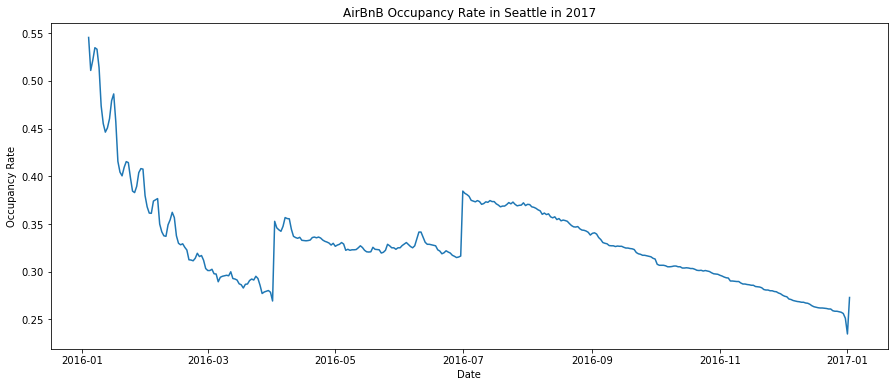

In [6]:
## Check the occupancy rate
plt.figure(figsize=(15,6))
plt.plot(calendar.groupby('date').mean()['occupied'])
plt.title('AirBnB Occupancy Rate in Seattle in 2017')
plt.xlabel('Date')
plt.ylabel('Occupancy Rate')
plt.show()

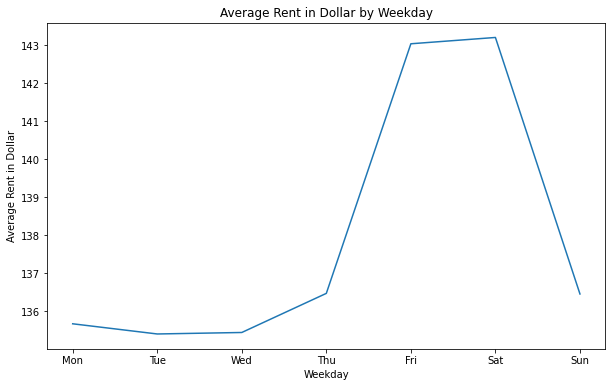

In [7]:
weekday = {'Mon': 0, 'Tue':1, 'Wed': 2, 'Thu': 3, 'Fri': 4, 'Sat':5, 'Sun': 6}
week_list = ['Mon', 'Tue', 'Wed', 'Thu', 'Fri', 'Sat', 'Sun']

calendar['weekday'] = calendar['date'].apply(lambda x: x.weekday())
calendar['weekday'] = calendar['weekday'].apply(lambda x: list(weekday.keys())[list(weekday.values()).index(x)])
available = calendar[calendar['available']==True]


by_weekly = available.groupby(by=['weekday']).mean()['price'].sort_values()
by_weekly = by_weekly.to_dict()
by_weekly = {k: by_weekly[k] for k in week_list if k in by_weekly}
by_weekly = pd.DataFrame({'day': list(by_weekly.keys()),  'average': list(by_weekly.values())})

plt.figure(figsize=(10,6))
plt.plot(by_weekly['day'], by_weekly['average'])
plt.title('Average Rent in Dollar by Weekday')
plt.ylabel('Average Rent in Dollar')
plt.xlabel('Weekday')
plt.show()

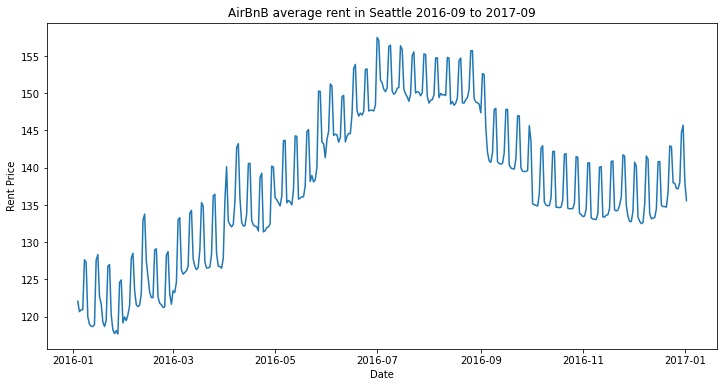

In [8]:
## Check the average price for available listings
available = calendar[calendar['available']==True]
plt.figure(figsize=(12,6))
plt.plot(available.groupby('date').mean()['price'])
plt.title('AirBnB average rent in Seattle 2016-09 to 2017-09')
plt.xlabel('Date')
plt.ylabel('Rent Price')
plt.show()

In [9]:
calendar['date'].apply(lambda x: x.month)
# calendar['month'] = calendar['date'].apply(lambda x: x.month)

0           1
1           1
2           1
3           1
4           1
           ..
1393565    12
1393566    12
1393567    12
1393568     1
1393569     1
Name: date, Length: 1393570, dtype: int64

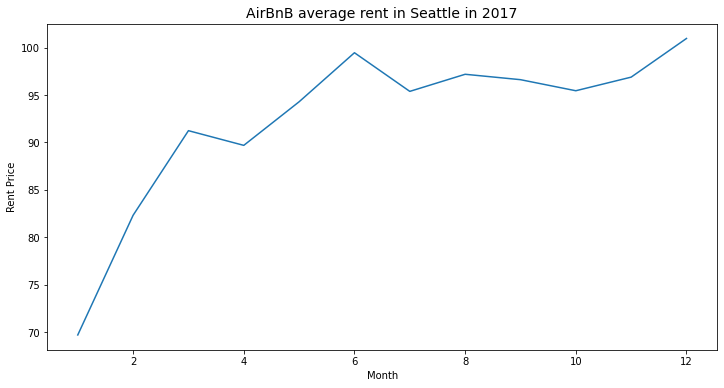

In [10]:
plt.figure(figsize=(12,6))
plt.plot(calendar.groupby('month').mean()['price'])
plt.title('AirBnB average rent in Seattle in 2017', fontsize=14)
plt.xlabel('Month')
plt.ylabel('Rent Price')

plt.show()

## Data Exploring in the listings dataset

In [11]:
listings = pd.read_csv('./data/listings.csv')
listings['price'] = listings['price'].apply(lambda x: x.replace("$", ""))
listings['price'] = listings['price'].apply(lambda x: x.replace(",", ""))
listings['price'] = pd.to_numeric(listings['price'])

'''Drop extreme outliers in price'''
from scipy import stats
listings = listings[(np.abs(stats.zscore(listings[['price']])) < 3).all(axis=1)]

'''Fill in missing values with the most frequent values'''
listings['beds'] = listings['beds'].fillna(listings['beds'].mode().iloc[0])
listings['bedrooms'] = listings['bedrooms'].fillna(listings['bedrooms'].mode().iloc[0])
listings['bathrooms'] = listings['bathrooms'].fillna(listings['bathrooms'].mode().iloc[0])
listings['bathrooms'] = listings['bathrooms'].fillna(listings['bathrooms'].mode().iloc[0])
listings['reviews_per_month'] = listings['reviews_per_month'].fillna(listings['reviews_per_month'].mode().iloc[0])

listings['price_per_beds'] = listings['price'] / listings['beds']

## Fill in the missing values with false
is_superhost = []
for row in listings['host_is_superhost']:
    if row == 't':
        is_superhost.append(1)
    else:
        is_superhost.append(0)
listings['host_is_superhost'] = is_superhost

'''Fill in missing zipcode manually'''
missed_zipcode = [98107, 98119, 98122, 98104, 98199, 98102, 98122]
listings.loc[listings.zipcode.isnull(), 'zipcode'] = missed_zipcode
listings['zipcode'] = listings['zipcode'].astype(str)

listings.head()

,id,listing_url,scrape_id,last_scraped,name,summary,space,description,experiences_offered,neighborhood_overview,...,requires_license,license,jurisdiction_names,instant_bookable,cancellation_policy,require_guest_profile_picture,require_guest_phone_verification,calculated_host_listings_count,reviews_per_month,price_per_beds
0,241032,https://www.airbnb.com/rooms/241032,20160104002432,2016-01-04,Stylish Queen Anne Apartment,NaN,Make your self at home in this charming one-be...,Make your self at home in this charming one-be...,none,NaN,...,f,NaN,WASHINGTON,f,moderate,f,f,2,4.07,85.0
1,953595,https://www.airbnb.com/rooms/953595,20160104002432,2016-01-04,Bright & Airy Queen Anne Apartment,Chemically sensitive? We've removed the irrita...,"Beautiful, hypoallergenic apartment in an extr...",Chemically sensitive? We've removed the irrita...,none,"Queen Anne is a wonderful, truly functional vi...",...,f,NaN,WASHINGTON,f,strict,t,t,6,1.48,150.0
3,7421966,https://www.airbnb.com/rooms/7421966,20160104002432,2016-01-04,Queen Anne Chateau,A charming apartment that sits atop Queen Anne...,NaN,A charming apartment that sits atop Queen Anne...,none,NaN,...,f,NaN,WASHINGTON,f,flexible,f,f,1,1.00,50.0
5,5956968,https://www.airbnb.com/rooms/5956968,20160104002432,2016-01-04,Private unit in a 1920s mansion,We're renting out a small private unit of one ...,If you include a bit of your background in you...,We're renting out a small private unit of one ...,none,This part of Queen Anne has wonderful views an...,...,f,NaN,WASHINGTON,f,strict,f,f,1,2.45,120.0
6,1909058,https://www.airbnb.com/rooms/1909058,20160104002432,2016-01-04,Queen Anne Private Bed and Bath,Enjoy a quiet stay in our comfortable 1915 Cra...,Enjoy a quiet stay in our comfortable 1915 Cra...,Enjoy a quiet stay in our comfortable 1915 Cra...,none,"Close restaurants, coffee shops and grocery st...",...,f,NaN,WASHINGTON,f,moderate,f,f,1,2.46,80.0


In [12]:
## Creating a map, credit: https://towardsdatascience.com/creating-a-simple-map-with-folium-and-python-4c083abfff94
# from folium.plugins import HeatMap
sub_map = listings[["latitude", "longitude", "id","price", "price_per_beds","bedrooms","property_type","accommodates"]]

map = folium.Map(location=[sub_map.latitude.mean(),
                           sub_map.longitude.mean()],
                 zoom_start=11, control_scale=True)

colormap = cm.LinearColormap(colors=['blue', 'cyan', 'yellow', 'orange', 'red'],
                             index=[0, 100, 200, 300, 400], vmin=0, vmax=400,
                             caption='Rent Price')

lat = list(sub_map.latitude)
lon = list(sub_map.longitude)
price = list(sub_map.price)
price_per_bed = list(sub_map.price_per_beds)


for loc, p in zip(zip(lat, lon), price):
    rent = sub_map[(sub_map['latitude'] == loc[0]) & (sub_map['longitude'] == loc[1])]['price'].item()
    prop = sub_map[(sub_map['latitude'] == loc[0]) & (sub_map['longitude'] == loc[1])]['property_type'].item()
    person = sub_map[(sub_map['latitude'] == loc[0]) & (sub_map['longitude'] == loc[1])]['accommodates'].item()
    bedroom = int(sub_map[(sub_map['latitude'] == loc[0]) & (sub_map['longitude'] == loc[1])]['bedrooms'].item())
    popup = f'lat:{loc[0]},\nlon:{loc[1]},\n{prop},\n{bedroom} bedrooms,\n${rent}.'
    
    folium.CircleMarker(
        location=loc,
        radius=1.5,
        fill = True,
        color=colormap(p),
        opacity=0.5,
        popup = popup
    ).add_to(map)

map.add_child(colormap)


# for index, location_info in sub_map.iterrows():
#     folium.CircleMarker([location_info["latitude"], location_info["longitude"]],
#                         popup=location_info["id"], radius=1, opacity=0.5).add_to(map)

# HeatMap(sub_map).add_to(map)
map.save('C:/Users/81801/OneDrive/ドキュメント/★Programming/★★Udacity/Seattle-AirBnB/ScatterListings.html')
map

In [13]:
neighbor = listings.groupby('neighbourhood_cleansed').mean()
meds = listings.groupby('neighbourhood_cleansed').median()['price']
neighbor['med_price'] = meds
counts = pd.DataFrame({'num_of_listings' :listings['neighbourhood_cleansed'].value_counts()})
neighbor = neighbor.join(counts)
neighbor = neighbor.reset_index()
map = folium.Map(location=[neighbor.latitude.mean(),
                           neighbor.longitude.mean()],
                 zoom_start=11, control_scale=True)

colormap = cm.LinearColormap(colors=['blue', 'cyan', 'yellow', 'orange', 'red'],
                             index = [0, 50, 100, 150, 200], vmin=0, vmax=200,
                             caption='Rent Price')

lat = list(neighbor.latitude)
lon = list(neighbor.longitude)
price = list(neighbor.price)
med_price = list(neighbor.med_price)
# price_per_beds = list(neighbor.price_per_beds)


for loc, p in zip(zip(lat, lon), med_price):
    name = neighbor[(neighbor['latitude'] == loc[0]) & (neighbor['longitude'] == loc[1])]['neighbourhood_cleansed'].item()
    rent = round(neighbor[(neighbor['latitude'] == loc[0]) & (neighbor['longitude'] == loc[1])]['med_price'].item(), 1)
    popup = f'<b>{name}</b>,\n Avg Rent: ${rent}'
#     radius = neighbor[(neighbor['latitude'] == loc[0]) & (neighbor['longitude'] == loc[1])]['num_of_listings'].item()
    
    folium.CircleMarker(
        location=loc,
        radius= 15,
        fill = True,
        color=colormap(p),
        fill_opacity=0.8,
        popup = popup
    ).add_to(map)
map.add_child(colormap)


# for index, location_info in sub_map.iterrows():
#     folium.CircleMarker([location_info["latitude"], location_info["longitude"]],
#                         popup=location_info["id"], radius=1, opacity=0.5).add_to(map)

# HeatMap(sub_map).add_to(map)
map.save('C:/Users/81801/OneDrive/ドキュメント/★Programming/★★Udacity/Seattle-AirBnB/NeighborListings.html')
map

In [14]:
## Credit: https://medium.com/@sosterburg/mapping-data-with-folium-356f0d6f88a9
import json
with open('./data/City_Clerk_Neighborhoods.geojson', 'r') as jsonFile:
    geo_data = json.load(jsonFile)
tmp = geo_data

geozips = []
for i in np.arange(len(tmp['features'])):
    if tmp['features'][i]['properties']['S_HOOD'] in list(neighbor['neighbourhood_cleansed'].unique()):
        geozips.append(tmp['features'][i])
        
# creating new JSON object
new_json = dict.fromkeys(['type','features'])
new_json['type'] = 'FeatureCollection'
new_json['features'] = geozips
# save uodated JSON object
open("cleaned_geodata.json", "w").write(json.dumps(new_json, sort_keys=True, indent=4, separators=(',', ': '))) 

6150864

In [33]:
neighbor['num_of_listings']

0      69
1      41
2       5
3      53
4     225
     ... 
82     63
83     15
84     25
85      9
86     17
Name: num_of_listings, Length: 87, dtype: int64

In [34]:
def map_feature_by_neighbor(neighbor, col):
    """
    Generates a folium map of Seattle
    :param neighbor: neighborhood dataset
    :param col: feature to display
    :return: m
    """
    # read updated geo data
    with open('cleaned_geodata.json', 'r') as jsonFile:
        king_geo = json.load(jsonFile)

    # Initialize Folium Map with Seattle latitude and longitude
    m = folium.Map(location=[neighbor.latitude.mean(), neighbor.longitude.mean()], zoom_start=10,
                   detect_retina=True, control_scale=False)
    
    # prepare the customised text
    popup_text = []
    for i in range(len(neighbor)):
        name = neighbor['neighbourhood_cleansed'][i]
        rent = round(neighbor['med_price'][i], 1)
        num = neighbor['num_of_listings'][i]
        popup = f'<b>{name}</b>, \n{num} listings, \n Median Rent: ${rent}'
        popup_text.append(popup)
    neighbor['popup_text'] = popup_text

    # Append a tooltip column with customised text
    for idx in range(len(popup_text)):
        hood = king_geo['features'][idx]['properties']['S_HOOD']
        king_geo['features'][idx]['properties']['District'] = neighbor[neighbor['neighbourhood_cleansed']==hood]['popup_text'].item()
    
    
    # Create choropleth map
    m.choropleth(
        geo_data=king_geo,
        name='choropleth',
        data= neighbor,
        # col: feature of interest
        columns=['neighbourhood_cleansed', col],
        key_on = 'feature.properties.S_HOOD',
        fill_color= 'Spectral_r',
        fill_opacity=0.8,
        line_opacity=0.2,
        legend_name='Median Rent Price'
    )
    
    folium.GeoJson(king_geo,
                   style_function= lambda feature: {
#                        'fillColor': colormap(feature),
                       'color': 'black',
                       'weight': 0.5,
                       'dashArray': '3, 3',
                       'fillOpacity':0.0}, 
                   tooltip = folium.features.GeoJsonTooltip(fields=['District'])
                    ).add_to(m)
    
    folium.LayerControl().add_to(m)

    # Save map based on feature of interest
    m.save(col + '.html')

    return m

## Use the map_feature_by_neighbor to map choropleth map
map_feature_by_neighbor(neighbor, 'med_price')

In [ ]:
# prepare the customised text
tooltip_text = []
for idx in range(len(data2)):
 tooltip_text.append(data2[‘Chi_name’][idx]+’ ‘+ 
 str(int(round(data2[‘18–35 (Proportion in 2019)’][idx]*100)))+’%’)
tooltip_text
# Append a tooltip column with customised text
for idx in range(len(tooltip_text)):
    map_data['features'][idx]['properties']['tooltip1'] = tooltip_text[idx]

## Check the correlation with price and other features

In [35]:
subset = listings[['price','host_is_superhost','neighbourhood_cleansed',
                  'latitude', 'longitude', 'room_type', 'accommodates', 
                  'bathrooms', 'bedrooms', 'beds','number_of_reviews','reviews_per_month','calculated_host_listings_count']]

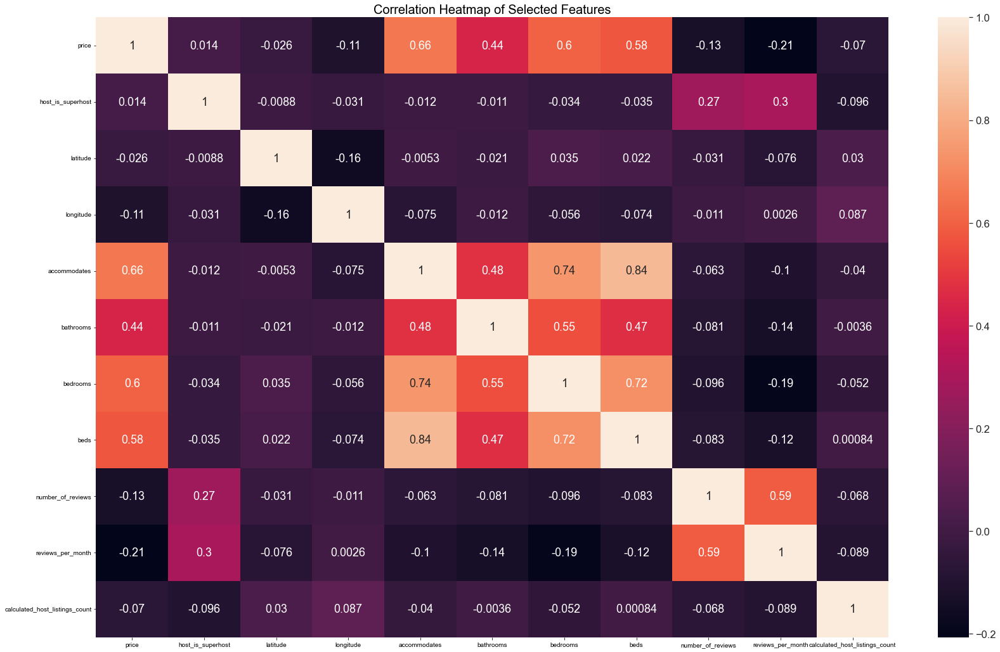

In [36]:
plt.figure(figsize = (28,18))
ax = plt.axes()
sns.set(font_scale=1.5)
sns.heatmap(subset.corr(), annot=True)
ax.set_title('Correlation Heatmap of Selected Features', fontsize=20)
plt.savefig('corr_heatmap.png')

In [ ]:
y = subset['price']
X = subset.drop(columns=['price'])
X_train_raw, X_test_raw, y_train, y_test = train_test_split(X, y, test_size=0.25, random_state=42)

cat_cols = ['host_is_superhost','neighbourhood_cleansed', 'room_type']
con_cols = ['latitude', 'longitude', 'accommodates', 'bathrooms', 'bedrooms',
            'beds','number_of_reviews','reviews_per_month','calculated_host_listings_count']
preprocessor_ohe = ColumnTransformer(transformers=[('cat', OneHotEncoder(categories='auto'), cat_cols),
                                                   ('cont', StandardScaler(), con_cols)])
X_train_ohe = preprocessor_ohe.fit_transform(X_train_raw)
X_test_ohe = preprocessor_ohe.transform(X_test_raw)

In [ ]:
rf_reg = ensemble.RandomForestRegressor(n_estimators=200,  # number of trees
                                        criterion='mse',  # how to measure fit
                                        max_depth=None,  # how deep tree nodes can go
                                        min_samples_split=2,  # samples needed to split node
                                        min_samples_leaf=1,  # samples needed for a leaf
                                        min_weight_fraction_leaf=0.0,  # weight of samples needed for a node
                                        max_features='auto',  # max feats
                                        max_leaf_nodes=None,  # max nodes
                                        n_jobs=1, # how many to run parallel
                                        random_state=42)

model = rf_reg.fit(X_train_ohe, y_train.ravel())

In [ ]:
from sklearn.metrics import mean_squared_error
y_test_pred = model.predict(X_test_ohe)
y_train_pred = model.predict(X_train_ohe)

rf_mse = mean_squared_error(y_test, y_test_pred) 
rf_rmse = np.sqrt(rf_mse) 
print('The RMSE is: ',rf_rmse)

norm_rmse = rf_rmse / (y_test.max() - y_test.min())
print('The Normalized RMSE is ', norm_rmse)

# R-Squared score
print('The R2 score is: ', model.score(X_test_ohe, y_test))
## RMSE is around 37. This is just 10% of the range in price. This seems good to me while the R2 score is around 62%.

In [ ]:
# # Credit: https://medium.com/@manilwagle/predicting-house-prices-using-machine-learning-cab0b82cd3f
# from sklearn.model_selection import GridSearchCV
# param_grid = [
#     # try 12 (3×4) combinations of hyperparameters
#     {'n_estimators': [50, 100, 200], 'max_features': [2,4,6,8,16]},
#     # then try 6 (2×3) combinations with bootstrap set as False
#     {'bootstrap': [False], 'n_estimators': [3, 10], 'max_features': [2, 3, 4]},
#   ]
# rf_reg = ensemble.RandomForestRegressor(random_state=42)

# # train across 5 folds, that's a total of (12+6)*5=90 rounds of training 
# grid_search = GridSearchCV(rf_reg, param_grid, cv=5,
#                            scoring='neg_mean_squared_error',
#                            return_train_score=True)

# grid_search.fit(X_train_ohe, y_train.ravel())
# grid_search.best_params_

In [ ]:
# final_model = grid_search.best_estimator_

# y_test_pred = final_model.predict(X_test_ohe)
# y_train_pred = final_model.predict(X_train_ohe)

# rf_mse = mean_squared_error(y_test, y_test_pred) 
# rf_rmse = np.sqrt(rf_mse) 
# print('The RMSE is: ',rf_rmse)

# # Accuracy score
# print('The R2 score is: ', final_model.score(X_test_ohe, y_test))

In [ ]:
listings['price'].describe()